In [1]:
import scipy.datasets
import numpy as np
import cv2
from skimage.color import rgb2ycbcr,ycbcr2rgb
import matplotlib.pyplot as plt
%matplotlib inline

C:\ProgramData\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


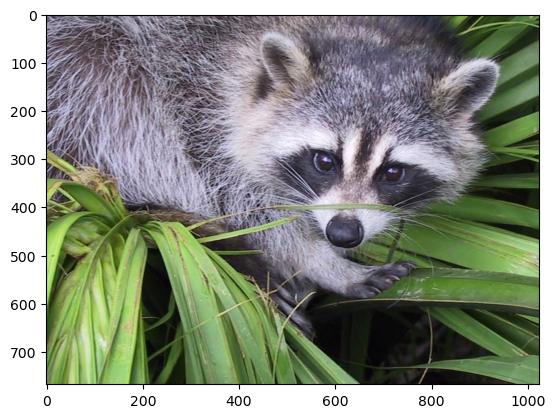

In [2]:
img = scipy.datasets.face() # Bir rakun yüzünün 1024 x 768, renkli görüntüsünü elde ederiz.
figsize=(8,8) # Grafiğin boyutunu 8x8 olacak şekilde ayarlıyoruz.
plt.imsave("image_save.png", img)  # Resmi kaydediyoruz.
plt.imshow(img);

In [3]:
# Bazı değişkenlerin değerlerini ayarlıyoruz. Değerlere istediğimiz zaman müdehale edebiliriz.

w=8  # Varsayılan niceleme tablosu 8x8 boyutundadır. Bundan dolayı resmin satır ve sütun değerlerini 8 e bölüyoruz.
w=max(2,min(8,w)) 
h=w

print("Image: ", img.shape)  # (768, 1024, 3)

xLen = img.shape[1] // w  # 1024 // 8 = 128
yLen = img.shape[0] // h  # 768 // 8 = 96

print("Sütun: ", xLen)
print("Satır: ", yLen)

runBits = 1   
bitBits = 3   
rbBits = runBits+bitBits 
useYCbCr = True   
useHuffman = True 
quantizationRatio = 1   # niceleme tablosu = varsayılan niceleme tablosu * niceleme oranı

Image:  (768, 1024, 3)
Sütun:  128
Satır:  96


## RGB görüntüsünü YCbCr görüntüsüne aktarıyoruz.

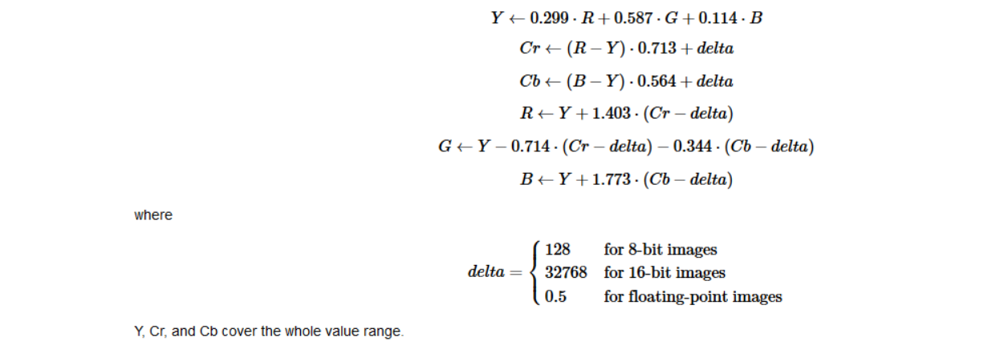

In [ ]:
##########################################################################################################
# OpenCV, RGB sıralamasını değil, BGR sıralamasını kullanır.
from typing import List

def bgr_pixel_to_ycrcb(bgr: list) -> List[int]:
    return [
        round(0.299 * bgr[2] + 0.587 * bgr[1] + 0.114 * bgr[0]),  # Y'
        round((bgr[2] - round((0.299 * bgr[2] + 0.587 * bgr[1] + 0.114 * bgr[0]))) * 0.713 + 128),  # Cr
        round((bgr[0] - round((0.299 * bgr[2] + 0.587 * bgr[1] + 0.114 * bgr[0]))) * 0.564 + 128)  # Cb
    ]

def ycrcb_pixel_to_bgr(ycrcb: list) -> List[int]:
    return [
        round(ycrcb[0] + 1.773 * (ycrcb[2] - 128)),  # B
        round(ycrcb[0] - 0.714 * (ycrcb[1] - 128) - 0.344 * (ycrcb[2] - 128)),  # G
        round(ycrcb[0] + 1.403 * (ycrcb[1] - 128))  # R
    ]

def bgr_to_ycrcb(matrix3d: np.ndarray) -> np.ndarray:
    return np.apply_along_axis(bgr_pixel_to_ycrcb, 2, matrix3d)

def ycrcb_to_bgr(matrix3d: np.ndarray) -> np.ndarray:
    return np.apply_along_axis(ycrcb_pixel_to_bgr, 2, matrix3d).clip(0, 255).astype(np.uint8)

bitmap = bgr_to_ycrcb(bitmap)
##########################################################################################################

True

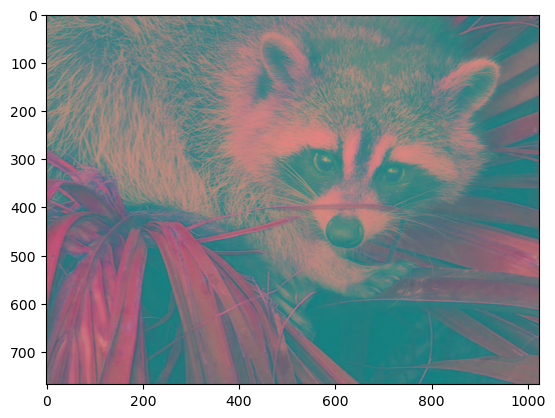

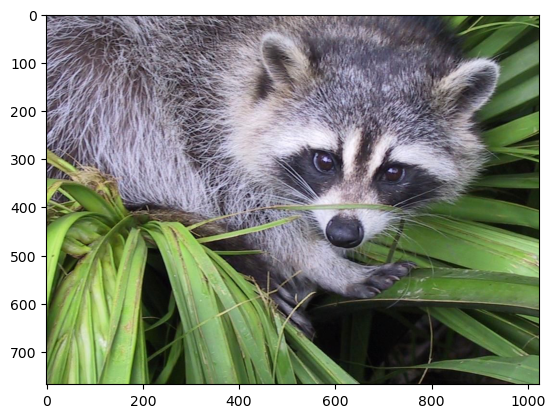

In [4]:
from skimage.color import rgb2ycbcr, ycbcr2rgb

def myYcbcr2rgb(ycbcr):
    return (ycbcr2rgb(ycbcr).clip(0,1)*255).astype(np.uint8)
# skimage.color.ycbcr2rgb: YCbCr'den RGB renk uzayına dönüştürme.
# clip(): Bu fonksiyon, bir dizideki değerleri belirlenen aralık içinde tutar. 
# Aralığın dışındaki değerler, aralığın alt ve üst limitlerine kırpılır.
# Buradaki clip(0,1)*255 ifadesi ile değerleri 0 ile 255 arasında tutulacağı ifade edilir.
# 255 den büyük değerler 255 olacak şekilde ya da 0 dan küçük değerler 0 olacak şekilde güncelenir.

img = scipy.datasets.face()
originalImg=np.copy(img)

ycbcr=rgb2ycbcr(img)

rgb=myYcbcr2rgb(ycbcr)

plt.imshow(ycbcr.astype(np.uint8))
plt.figure()
plt.imshow(rgb)

if (useYCbCr):
    img=ycbcr
    
np.allclose(rgb, originalImg, atol=1)
# allclose(): Bu fonksiyon, 2 tane dizinin birbirine eşit ya da benzer olup olmadığını, 
# belirlenen tolerans değeri ile kontrol etmektedir.

## Görüntüyü bloklara dönüştürelim.

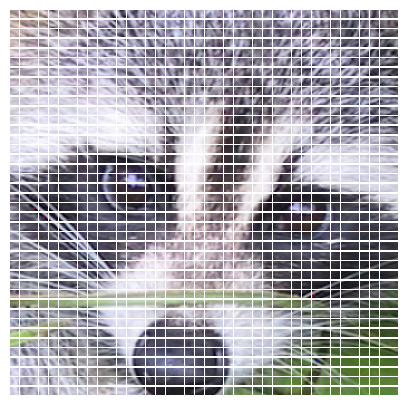

In [5]:
def toBlocks(img):
    blocks = np.zeros((yLen,xLen,h,w,3),dtype=np.int16)
    for y in range(yLen): #96
        for x in range(xLen): #128
            blocks[y][x]=img[y*h:(y+1)*h, x*w:(x+1)*w]
    return np.array(blocks)

blocks = toBlocks(img)

def plotBlocks(blocks, gray=False):
    xLen=blocks.shape[1]
    yLen=blocks.shape[0]
    for y in range(yLen):
        for x in range(xLen):
            plt.subplot(yLen, xLen, 1+xLen*y+x)
            plt.imshow(blocks[y][x], cmap=plt.cm.gray if gray else plt.cm.Accent)
            plt.axis('off')
            
x1 = int(0.47*xLen) # x1, x2, y1, y2 yüzün kapladığı alanı ifade eder.
y1 = int(0.21*yLen)
plt.figure(figsize=(5,5))

if(useYCbCr):
    def ycbcrBlock2rgb(block):
        return (ycbcr2rgb(block) * (255 / ycbcr2rgb(block).max())).astype(np.uint8)
    plotBlocks(np.array(list(map(ycbcrBlock2rgb,blocks[y1:y1+40,x1:x1+40]))))
else:
    plotBlocks(blocks[y1:y1+40,x1:x1+40])

# 3.DCT (Discrete Cosine Transform)
### DCT'yi sırasıyla tüm bloklarda çalıştıralım.

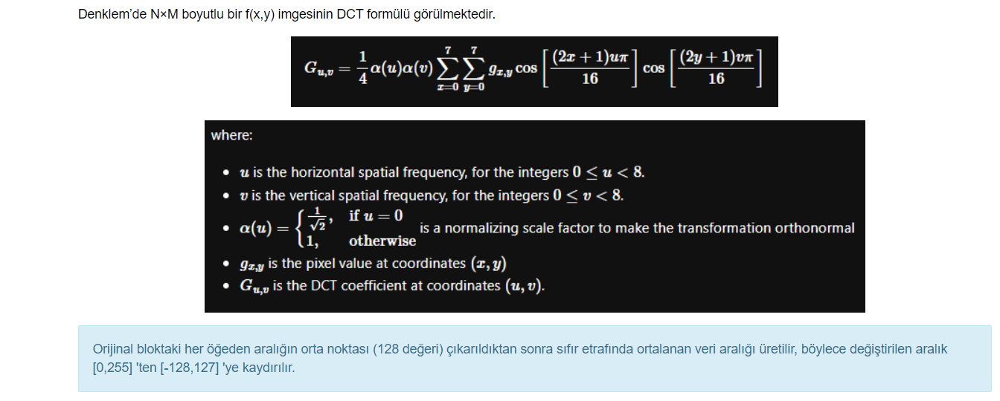

In [ ]:
######################################################################################################
def normalize_to_zero(matrix: np.ndarray) -> np.ndarray:
    return matrix - 128

def cos_element(x, u):
    return math.cos((2 * x + 1) * u * math.pi / 16)

def alpha(u):
    return 1 / math.sqrt(2) if u == 0 else 1

def g_uv(u, v, matrix):
    return (1 / 4) * alpha(u) * alpha(v) * sum( matrix[x][y] * cos_element(x, u) * cos_element(y, v)
                                                for x in range(len(matrix)) #satır
                                                for y in range(len(matrix[0])) #sütun
                                              )

def discrete_cosine_transform(matrix: np.ndarray) -> np.ndarray:
    return np.array([ [g_uv(y, x, matrix) for x in range(len(matrix[y]))]
                      for y in range(len(matrix))
                    ])

def dct(matrix: np.ndarray) -> np.ndarray:
    return discrete_cosine_transform(normalize_to_zero(matrix))

y_dct = [dct(sub_matrix) for sub_matrix in y_split]
cr_dct = [dct(sub_matrix) for sub_matrix in cr_split]
cb_dct = [dct(sub_matrix) for sub_matrix in cb_split]
######################################################################################################

In [6]:
from scipy.fftpack import dct,idct

def dctOrDedctAllBlocks(blocks, type="dct"):
    f = dct if type=="dct" else idct
    dedctBlocks = np.zeros((yLen,xLen,h,w,3)) # Sıfırlardan oluşan 8x8 lik matrix
    for y in range(yLen): # yLen = 96
        for x in range(xLen): # xLen = 128
            d = np.zeros((h,w,3)) # (8, 8, 3)
            for i in range(3):
                block = blocks[y][x][:,:,i] # Her bir renk uzayı için 8x8 lik bloklar
                # Genellikle 2. tip DCT kullanılır, ters dönüşüm için 3. tip DCT kullanılır.
                # Normalize edilmemiş III. Tip DCT, normalize edilmemiş II. Tip DCT'nin tersidir. 
                # Ortonormal III. Tip DCT ise ortonormal II. Tip DCT'nin tam olarak tersidir.
                # Bunun dışında ters dönüşüm IDCT ile elde edilir.
                d[:,:,i]=f(f(block.T, norm = 'ortho').T, norm = 'ortho') # DCT
                
                if (type!="dct"):
                    d=d.round().astype('int16')
            dedctBlocks[y][x]=d
    return dedctBlocks

dctBlocks = dctOrDedctAllBlocks(blocks, "dct")

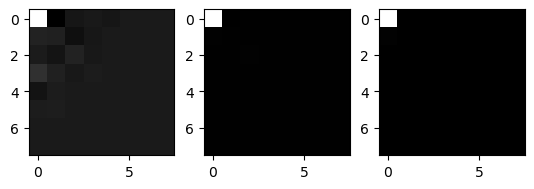

In [7]:
# Bir dct bloğunun r-g-b/YCbCr kanallarına örnek

def exampleOnRGB(block):
    plt.subplot(1,3,1)    # red
    plt.imshow(block[0][0][:,:,0], cmap=plt.cm.gray)
    plt.subplot(1,3,2)    # green
    plt.imshow(block[0][0][:,:,1], cmap=plt.cm.gray)
    plt.subplot(1,3,3)    # blue
    plt.imshow(block[0][0][:,:,2], cmap=plt.cm.gray)
    
exampleOnRGB(dctBlocks)

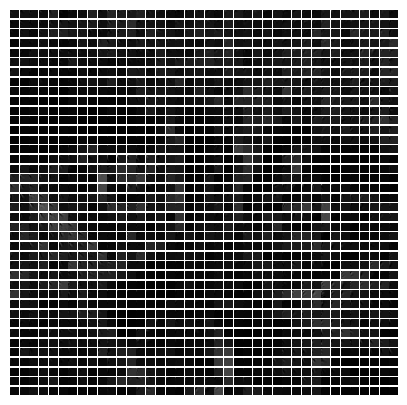

In [8]:
plt.figure(figsize=(5,5))
redChannel = dctBlocks[:, :, :, :, 0]
plotBlocks(redChannel[20:60,60:100],True)

### DCT bloklarını tekrar görüntüye dönüştürmek istersek aşağıdaki gibi bir çıktı elde ederiz.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


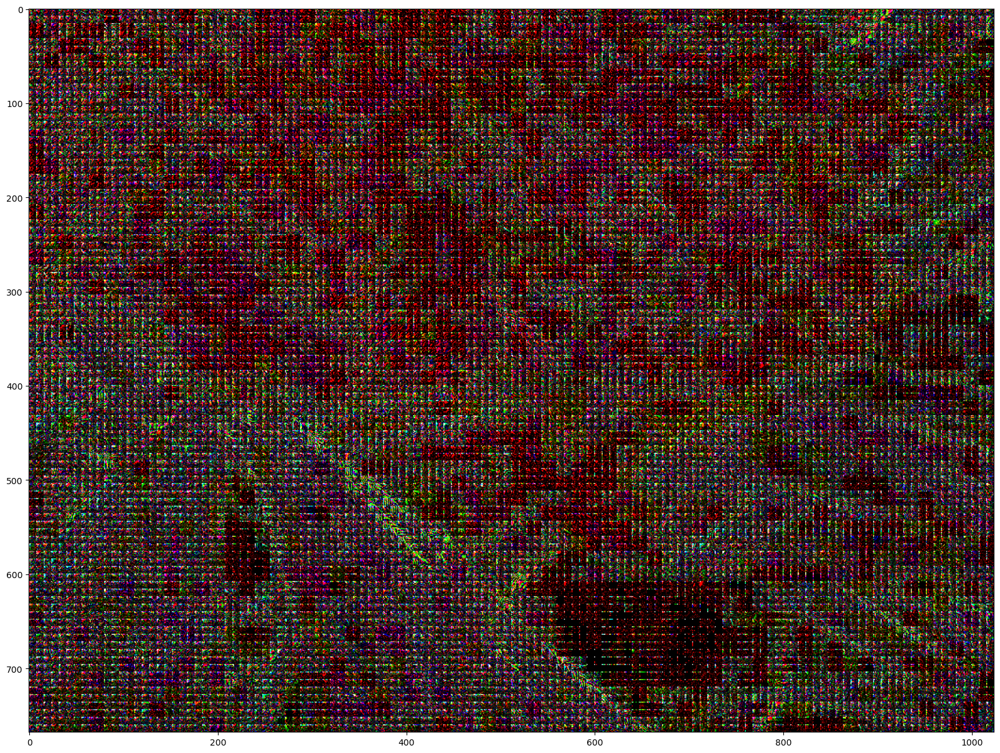

In [9]:
def blocks2img(blocks):
    W = xLen * w
    H = yLen * h
    img = np.zeros((H,W,3))
    for y in range(yLen):
        for x in range(xLen):
            img[y*h:y*h+h,x*w:x*w+w] = blocks[y][x]
    return img

newImg = blocks2img(dctBlocks)

plt.figure(figsize=(20,20))
plt.imshow(newImg);

# 4.Quantized DCT

### Tüm dct bloklarını nicelemek için varsayılan niceleme tablolarını kullanıyoruz.

In [10]:
# quantization table
QY = np.array([[16,11,10,16,24,40,51,61],
          [12,12,14,19,26,58,60,55],
          [14,13,16,24,40,57,69,56],
          [14,17,22,29,51,87,80,62],
          [18,22,37,56,68,109,103,77],
          [24,35,55,64,81,104,113,92],
          [49,64,78,87,103,121,120,101],
          [72,92,95,98,112,100,103,99]])

QC = np.array([[17,18,24,47,99,99,99,99],
               [18,21,26,66,99,99,99,99],
               [24,26,56,99,99,99,99,99],
               [47,66,99,99,99,99,99,99],
               [99,99,99,99,99,99,99,99],
               [99,99,99,99,99,99,99,99],
               [99,99,99,99,99,99,99,99],
               [99,99,99,99,99,99,99,99]])

QY = QY[:w,:h]
QC = QC[:w,:h]

qDctBlocks = np.copy(dctBlocks)

# tüm r-g-b/Y-Cb-Cr 3 kanallarının nicelenmesi gerekir. 
# moveaxis: Bir dizinin eksenlerini yeni konumlara taşınır. Diğer eksenler orijinal sıralarında kalır. 
Q3 = np.moveaxis(np.array([QY] + [QC] + [QC]), 0, 2) * quantizationRatio if useYCbCr else dstack([QY * quantizationRatio] * 3)
# quantizationRatio = 1
Q3 = Q3 * ((11 - w) / 3)
qDctBlocks = (qDctBlocks / Q3).round().astype('int16') 
print(qDctBlocks[0][0][:,:,0])

[[ 61 -10  -2   0  -1   0   0   0]
 [  3   2  -3  -1   0   0   0   0]
 [  0  -2   2   0   0   0   0   0]
 [  7   1   0   0   0   0   0   0]
 [ -2   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]]


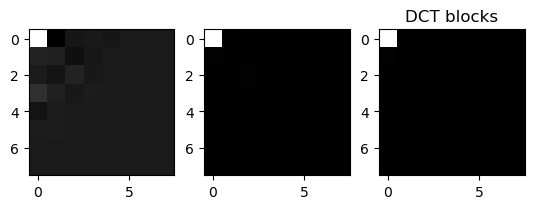

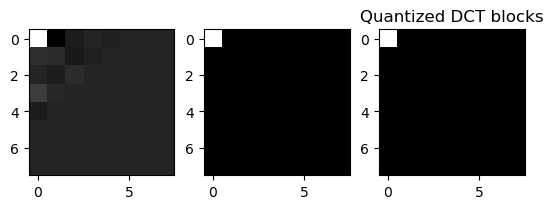

In [11]:
# dct bir nicelenmiş dct bloğunun r-g-b/Y-Cb-Cr kanallarının örneği

exampleOnRGB(dctBlocks) # dct blokları
plt.title("DCT blocks")
plt.figure()
exampleOnRGB(qDctBlocks)  # nicelenmiş DCT blokları
plt.title("Quantized DCT blocks");

## Quantized DCT bloklarını tekrar görüntüleyelim.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


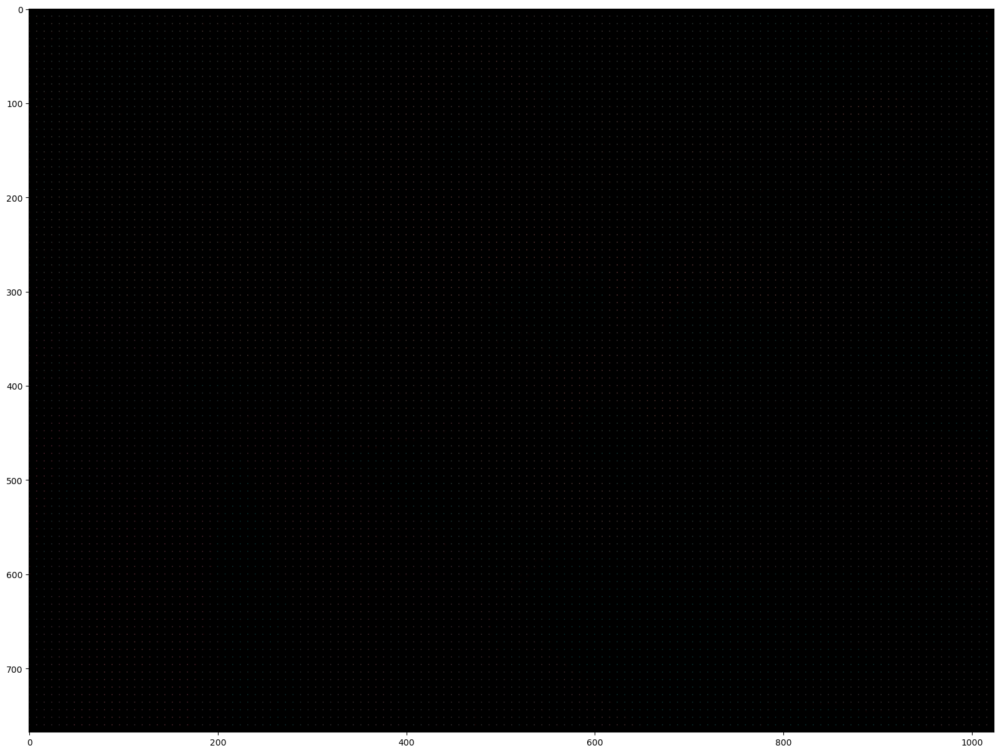

In [12]:
qDctImg = blocks2img(qDctBlocks).astype('int16')
plt.figure(figsize=(20,20))
plt.imshow(qDctImg);

### Sonuç görüntüsünün farkını kontrol etmek için rastgele bir kötü niceleme tablosunu deneyelim.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


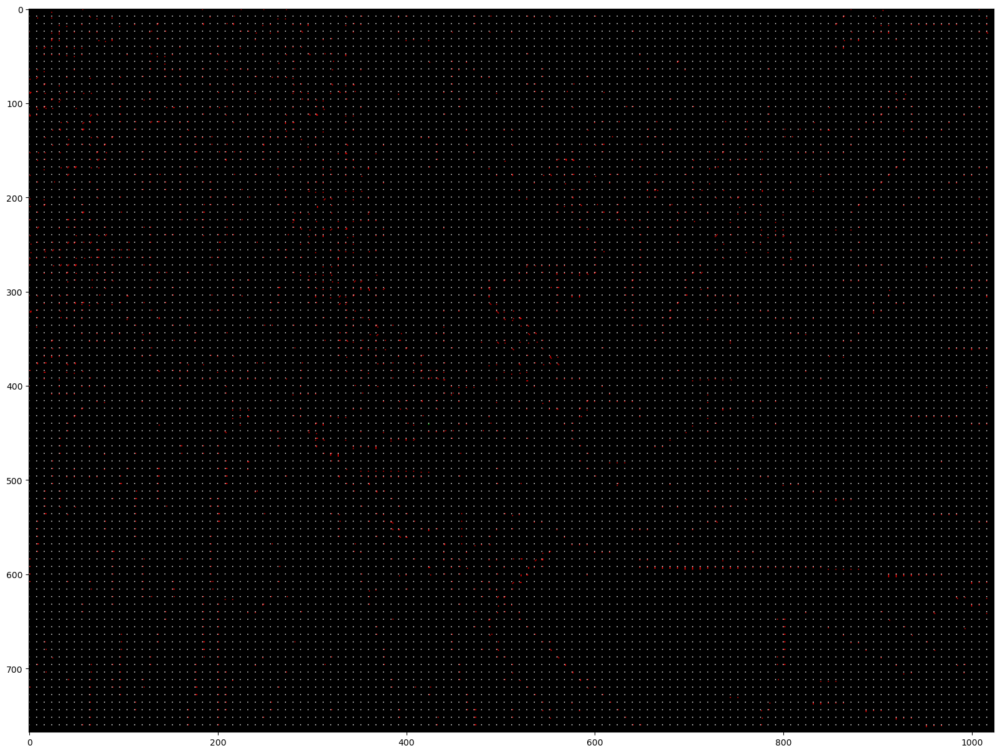

In [13]:
Qrandom = np.arange(200, 200 + w * h).reshape(w,h)
qRandDctBlocks = np.copy(dctBlocks)
Qr3 = np.dstack([Qrandom] * 3)
qRandDctBlocks /= Qr3
qRandDctBlocks = qRandDctBlocks.round().astype('int16')
plt.figure(figsize=(20,20))
plt.imshow(blocks2img(qRandDctBlocks));

## 3 çeşit DCT durumunu gözlemleyelim.

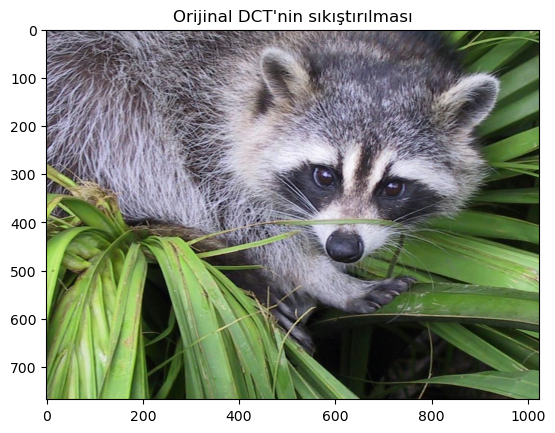

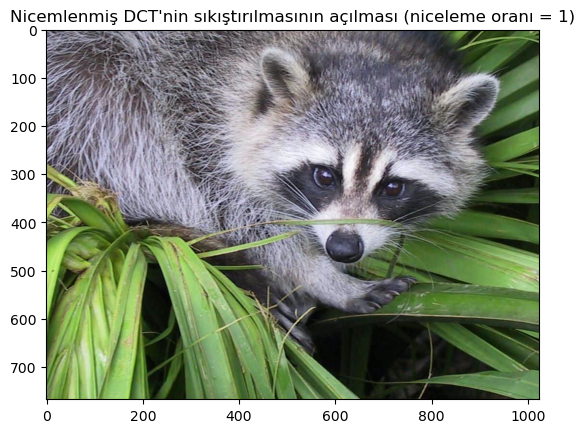

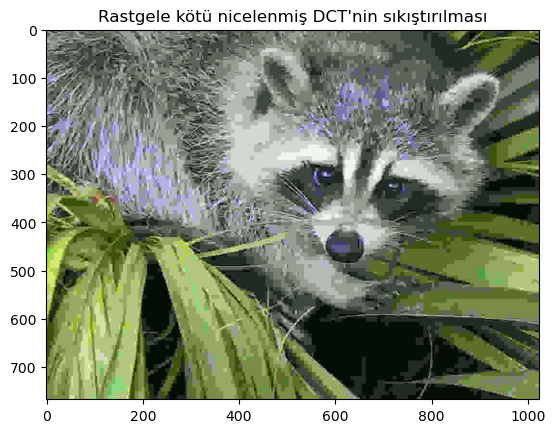

In [14]:
plt.figure()
plt.title("Orijinal DCT'nin sıkıştırılması")
dedctBlocks = dctOrDedctAllBlocks(dctBlocks, "idct")
plt.imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype('int16'))
plt.figure()
plt.title("Nicemlenmiş DCT'nin sıkıştırılmasının açılması (niceleme oranı = " + str(quantizationRatio) + ")")
dedctBlocks = dctOrDedctAllBlocks(qDctBlocks * Q3, "idct")
plt.imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype('int16'))
plt.figure()
plt.title("Rastgele kötü nicelenmiş DCT'nin sıkıştırılması")
dedctBlocks=dctOrDedctAllBlocks(qRandDctBlocks * Qr3, "idct")
plt.imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype('int16'));

# Zig-Zag

In [15]:
def zigZag(block):
    
    lines=[[] for i in range(h + w - 1)] # 15

    for y in range(h): 
        for x in range(w): 
            i=y+x 
            # i = 0,1,2,3,4,5,6,7,  1,2,3,4,5,6,7,8,  2,3,4,5,6,7,8,9,  3,4,5,6,7,8,9,10, ....., 7,8,9,10,11,12,13,14
            # print(block[y][x])  # 61 -10 -2 0 -1 0 0 0 3 2 -3 -1 0 0 0 0 0 -2 2 0 0 .....0 0 0
            if(i%2 == 0): 
                lines[i].insert(0, block[y][x])  
                # print(lines[i])
            else:  
                lines[i].append(block[y][x]) 
                # print(lines[i])
                
    return np.array([coefficient for line in lines for coefficient in line])

print(qDctBlocks[0][0][:,:,0])
zigZag(qDctBlocks[0][0][:,:,0])

[[ 61 -10  -2   0  -1   0   0   0]
 [  3   2  -3  -1   0   0   0   0]
 [  0  -2   2   0   0   0   0   0]
 [  7   1   0   0   0   0   0   0]
 [ -2   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0]]


array([ 61, -10,   3,   0,   2,  -2,   0,  -3,  -2,   7,  -2,   1,   2,
        -1,  -1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
      dtype=int16)

# Huffman

In [18]:
#%pylab inline
%matplotlib inline
import huffman
from collections import Counter

def huffmanCounter(zigZagArr):
    rbCount=[]
    run = 0
    # Bu kuantize matriste, ilk değer DC değeri olarak adlandırılır ve değerlerin geri kalanı AC değerleridir. 
    for AC in zigZagArr[1:]:
        if(AC!=0): # 0 dışındaki değerleri yakalamaya çalışıyoruz.
            AC=max(AC,1-2**(2**bitBits-1)) if AC<0 else min(AC,2**(2**bitBits-1)-1) 
                            # max(AC,-127) if AC<0 else min(AC,127)
            # bitBits = 3
            # print(1-2**(2**bitBits-1)) # -127
            # print(2**(2**bitBits-1)-1) # 127
            # print(AC)  # -10, 3, 2, -2, -3, -2, 7, -2, 1, 2, -1, -1, 
            # runBits = 1
            if(run>2**runBits-1): # 0>!1 -> run=1 ~ 1>!1 -> run=2 ~ 2>1
                runGap=2**runBits # 2
                k=run//runGap # 1
                for i in range(k): # i=0
                    rbCount.append('1'*runBits + '0'*bitBits) # '1'*runBits + '0'*bitBits = '1'*1 + '0'*3 = 1000
                run -= k*runGap # 2 - 1*2 = 0 -> run = 0
                
            run = min(run,2**runBits-1) # min(0, 1) -> run = 0
            bitSize = min(int(np.ceil(np.log(abs(AC) + 0.000000001)/np.log(2))), 2**bitBits-1) # min(4,7) -> bitSize=4
            # rbBits = runBits + bitBits -> rbBits = 4
            rbCount.append(format(run<<bitBits|bitSize,'0' + str(rbBits) + 'b')) # bitsel olarak sola kaydırma
            run=0
        else:
            run+=1 
    rbCount.append("0"*(rbBits))
    return Counter(rbCount)

rbCount = np.zeros(3, dtype=Counter)
rbCount[0] = huffmanCounter(zigZag(qDctBlocks[0][0][:,:,0]))
rbCount[1] = huffmanCounter(zigZag(qDctBlocks[0][0][:,:,1]))
rbCount[2] = huffmanCounter(zigZag(qDctBlocks[0][0][:,:,2]))
rbCount = sum(rbCount)

print("Huffman Kodlaması için (run,bit) sayacı:\n" + str(rbCount))
print("Huffman Kodlama:\n" + str(huffman.codebook(rbCount.items())))

Huffman Kodlaması için (run,bit) sayacı:
Counter({'0010': 5, '0001': 3, '0000': 3, '1010': 2, '0100': 1, '0011': 1})
Huffman Kodlama:
{'0100': '1011', '0010': '11', '1010': '100', '0011': '1010', '0001': '01', '0000': '00'}


## Çalışma Uzunluğu kodlaması

Tekrarlı uzunluk kodlaması, birbirini takip eden aynı sembollerin hepsinin saklanması yerine, sadece
sembol ve tekrar sayılarının saklanması mantığına dayalı bir kayıpsız sıkıştırma
algoritmasıdır.

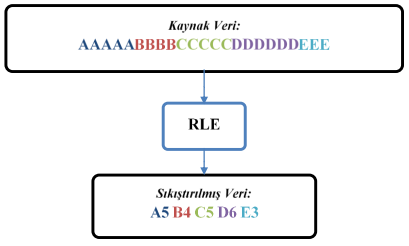

In [20]:
def runLength(zigZagArr,lastDC,hfm=None):
    rlc=[]
    run=0
    newDC=min(zigZagArr[0],2**(2**bitBits-1))
    DC=newDC-lastDC
    bitSize=max(0,min(int(np.ceil(np.log(abs(DC)+0.000000001)/np.log(2))),2**bitBits-1))
    code=format(bitSize, '0' + str(bitBits) + 'b')
    if (bitSize > 0):
        code += (format(DC,"b") if DC>0 else ''.join([str((int(b)^1)) for b in format(abs(DC),"b")]))
    for AC in zigZagArr[1:]:
        if(AC!=0):
            AC=max(AC,1-2**(2**bitBits-1)) if AC<0 else min(AC,2**(2**bitBits-1)-1)
            if(run>2**runBits-1):
                runGap=2**runBits
                k=run//runGap
                for i in range(k):
                    code+=('1'*runBits+'0'*bitBits)if hfm == None else  hfm['1'*runBits+'0'*bitBits]#end
                run-=k*runGap
            run=min(run,2**runBits-1) 
            bitSize=min(int(ceil(log(abs(AC)+0.000000001)/log(2))),2**bitBits-1)
            rb=format(run<<bitBits|bitSize,'0'+str(rbBits)+'b') if hfm == None else hfm[format(run<<bitBits|bitSize,'0'+str(rbBits)+'b')]
            code+=rb+(format(AC,"b") if AC>=0 else ''.join([str((int(b)^1)) for b in format(abs(AC),"b")]))
            run=0
        else:
            run+=1
    code+="0"*(rbBits) if hfm == None else  hfm["0"*(rbBits)]#end
    return code,newDC

code1,DC=runLength(zigZag(qDctBlocks[0][0][:,:,0]),0)
code2,DC=runLength(zigZag(qDctBlocks[0][0][:,:,1]),DC)
code3,DC=runLength(zigZag(qDctBlocks[0][0][:,:,2]),DC)
codeBlock=code1+code2+code3
print(codeBlock+"\nBu bloğun sıkıştırma boyutu: "+str(len(codeBlock)/8)+"KB\nBir bloğun orijinal boyutu: "+str(w*h*3)+"KB")

11011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000
Bu bloğun sıkıştırma boyutu: 13.0KB
Bir bloğun orijinal boyutu: 192KB


## Run-Length sonucunu bayt olarak kaydet

In [21]:
def runLength2bytes(code):
    return bytes([len(code)%8]+[int(code[i:i+8],2) for i in range(0, len(code), 8)])

# Aşağıda, bir bloğun kaydedilmesi ve yüklenmesi işleminin bir örneği gösterilmektedir.
print(codeBlock+"\n↓ Encoding: 8 uzunluğuna göre bölünmüş ")
print(str([codeBlock[i:i+8] for i in range(0, len(codeBlock), 8)])+"\n↓ int8 dönüştür ")
print(str([int(codeBlock[i:i+8],2) for i in range(0, len(codeBlock), 8)])+"\n↓ Bayt olarak kaydet")

code2bytes = runLength2bytes(codeBlock)

print(str(code2bytes)+"\n↓ Decoding: int8 olarak yükle ")
print(str(list(code2bytes))+"\n↓ Baytlara aktarma(binary)")
print(str([format(i,'08b') for i in list(code2bytes)])+"\n↓ Birleştir")

bytes2code = "".join([format(i,'08b') for i in list(code2bytes)])

print(bytes2code)

11011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000
↓ Encoding: 8 uzunluğuna göre bölünmüş 
['11011110', '10100010', '10010111', '01010001', '00110100', '00010010', '01111100', '10010001', '10010100', '00100001', '00000010', '11000001', '10110000']
↓ int8 dönüştür 
[222, 162, 151, 81, 52, 18, 124, 145, 148, 33, 2, 193, 176]
↓ Bayt olarak kaydet
b'\x00\xde\xa2\x97Q4\x12|\x91\x94!\x02\xc1\xb0'
↓ Decoding: int8 olarak yükle 
[0, 222, 162, 151, 81, 52, 18, 124, 145, 148, 33, 2, 193, 176]
↓ Baytlara aktarma(binary)
['00000000', '11011110', '10100010', '10010111', '01010001', '00110100', '00010010', '01111100', '10010001', '10010100', '00100001', '00000010', '11000001', '10110000']
↓ Birleştir
0000000011011110101000101001011101010001001101000001001001111100100100011001010000100001000000101100000110110000


# Görüntünün tüm blokları için jpeg olarak kaydetme işlemi

In [22]:
def huffmanCounterWholeImg(blocks):
    rbCount = np.zeros(xLen*yLen*3,dtype=Counter)
    zz = np.zeros(xLen*yLen*3,dtype=object)
    
    for y in range(yLen):
        for x in range(xLen):
            for i in range(3):
                zz[y*xLen*3+x*3+i] = zigZag(blocks[y, x,:,:,i])
                rbCount[y*xLen*3+x*3+i] = huffmanCounter(zz[y*xLen*3+x*3+i])
                
    return sum(rbCount), zz

rbCount, zz = huffmanCounterWholeImg(qDctBlocks)
print(rbCount)
hfm = huffman.codebook(rbCount.items())  # {sembol: kod} şeklinde çıktı verir.
print("\n{sembol: kod} = ", hfm, "\n")
sortedHfm = [[hfm[i[0]], i[0], rbCount[i[0]]] for i in rbCount.most_common()]
# most_common() tüm öğelerin ve sayımlarının bir listesini döndürür.
# Liste demetlerden oluşur ve her demet öğeyi ve öğe sayısını içerir. ('0001', 37498) ('0000', 36864) ... gibi
sortedHfm

Counter({'0001': 37498, '0000': 36864, '0010': 26819, '1000': 24740, '0011': 15050, '1001': 15021, '1010': 5628, '0100': 5192, '1011': 1729, '0101': 738, '1100': 315, '1101': 35, '0110': 26})


{sembol: kod} =  {'0100': '111011', '0010': '110', '1010': '11100', '0011': '100', '0001': '01', '0000': '00', '1000': '101', '1001': '1111', '1100': '111010001', '1011': '1110101', '0101': '11101001', '1101': '1110100001', '0110': '1110100000'} 




[['01', '0001', 37498],
 ['00', '0000', 36864],
 ['110', '0010', 26819],
 ['101', '1000', 24740],
 ['100', '0011', 15050],
 ['1111', '1001', 15021],
 ['11100', '1010', 5628],
 ['111011', '0100', 5192],
 ['1110101', '1011', 1729],
 ['11101001', '0101', 738],
 ['111010001', '1100', 315],
 ['1110100001', '1101', 35],
 ['1110100000', '0110', 26]]

In [23]:
print("(run,bit) occupies: "+str(sum(np.array(rbCount.most_common(),dtype=int32)[:,1]*rbBits)/8/2**10)+"KB") # öge sayılarını kullanıyoruz
print("(run,bit) after Huffman Coding occupies: "+str(sum([rbCount[k]*len(v) for k,v in hfm.items()])/8/2**10)+"KB") # öge*kod uzunluğunun toplamı

(run,bit) occupies: 82.83935546875KB
(run,bit) after Huffman Coding occupies: 59.7386474609375KB


In [24]:
def savingQuantizedDctBlocks(blocks):
    rbCount, zigZag = huffmanCounterWholeImg(blocks)
    hfm = huffman.codebook(rbCount.items())
    sortedHfm = [[hfm[i[0]],i[0]] for i in rbCount.most_common()]
    code = ""
    DC = 0
    
    for y in range(yLen):
        for x in range(xLen):
            for i in range(3):
                codeNew, DC = runLength(zigZag[y*xLen*3+x*3+i], DC, hfm if useHuffman else None)
                code += codeNew
                
    savedImg = runLength2bytes(code)
    print(str(code[:100]) + "......")
    print(str(savedImg[:20]) + "......")
    print("Resmin orjinal boyutu:    %.3f MB"%(img.size/(2**20)))
    print("Sıkıştırılmış görüntü boyutu: %.3f MB"%(len(savedImg)/2**20))
    print("Sıkıştırılma oranı:      %.2f : 1"%(img.size/2**20/(len(savedImg)/2**20)))
    return bytes([int(format(xLen,'012b')[:8],2),int(format(xLen,'012b')[8:]+format(yLen,'012b')[:4],2),int(format(yLen,'012b')[4:],2)])+savedImg,sortedHfm

import time
t1 = time.time()
savedImg, sortedHfmForDecode=savingQuantizedDctBlocks(qDctBlocks)
t2 = time.time()
print("Encoding: "+str(t2-t1)+" saniye")
save = open("img.bin", "wb")
save.write(savedImg)
save.close()

1101111011110110101110111110010110011110000110011001111100101111010010010000101100011011000110011110......
b'\x07\xde\xf6\xbb\xe5\x9e\x19\x9f/I\x0b\x1b\x19\xef%\xd4:\xbd\xc7o'......
Resmin orjinal boyutu:    2.250 MB
Sıkıştırılmış görüntü boyutu: 0.110 MB
Sıkıştırılma oranı:      20.41 : 1
Encoding: 11.046066522598267 saniye


1001100111010110111011010011111000110001000010111011010111110110111001101110101111110010100001000100......
b'\x05\x99\xd6\xed>1\x0b\xb5\xf6\xe6\xeb\xf2\x84D\x9d{m\x0e\x08\x8e'......
Resmin orjinal boyutu:    2.250 MB
Sıkıştırılmış görüntü boyutu: 0.047 MB
Sıkıştırılma oranı:      47.76 : 1


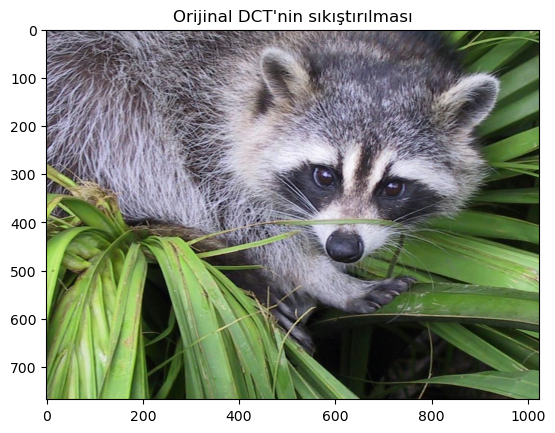

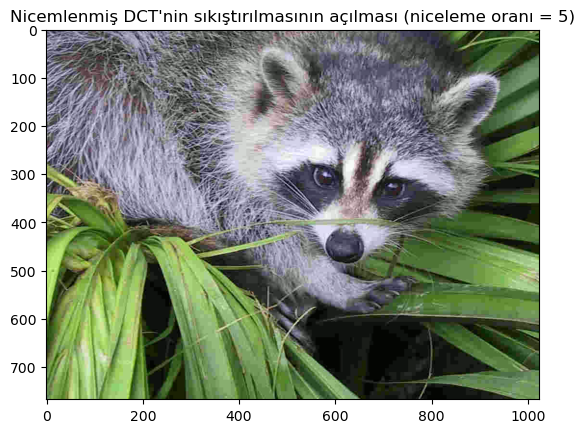

In [25]:
# quantizationRatio = 5 'i deniyoruz.
qr = 5
qDctBlocks5 = copy(dctBlocks)
Q3_5 = Q3*qr
qDctBlocks5 = (qDctBlocks5/Q3_5).round().astype('int16')

figure()
title("Orijinal DCT'nin sıkıştırılması")
dedctBlocks = dctOrDedctAllBlocks(dctBlocks, "idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
plt.imsave("saveImage.png", myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
figure()
title("Nicemlenmiş DCT'nin sıkıştırılmasının açılması (niceleme oranı = " + str(qr) + ")")
dedctBlocks = dctOrDedctAllBlocks(qDctBlocks5*Q3_5, "idct")
imshow(myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))
plt.imsave("saveImage1.png", myYcbcr2rgb(blocks2img(dedctBlocks)) if useYCbCr else blocks2img(dedctBlocks).astype(int16))

savedImg1, rbCount1 = savingQuantizedDctBlocks(qDctBlocks5)
save = open("img5foldCompression.bin", "wb")
save.write(savedImg1)
save.close()